In [1]:
import numpy as np
import IPython
import ipyplot
import cv2
from icecream import ic
import pathlib
import PIL
import PIL.ImageCms
import tempfile

In [63]:
def imshow(img):
    """Show image. 
    
    Image is a HWC (C: RGB) numpy array with values in the range 0-255."""
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    # cv2 imencode takes images in HWC dimension order.
    _,ret = cv2.imencode('.jpg', img) 
    i = IPython.display.Image(data=ret)
    IPython.display.display(i) 
    
    
def imlist(images, labels=None, use_tabs=False):
    if use_tabs:
        ipyplot.plot_class_tabs(images, labels, max_imgs_per_tab=300)
    else:
        ipyplot.plot_images(images, labels, img_width=300)
        
        
def load_img_RGB(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    img = np.array(img, dtype=np.float32)
    return img


def open_as_srgb(img_path):
    """Open an image and convert it to sRGB.
    
    The image must have an embedded ICC color profile."""
    img = PIL.Image.open(img_path)
    icc = tempfile.mkstemp(suffix='.icc')[1]
    with open(icc, 'wb') as f:
        f.write(img.info.get('icc_profile'))
    srgb = PIL.ImageCms.createProfile('sRGB')
    img = PIL.ImageCms.profileToProfile(img, icc, srgb)
    return img

def blur(img):
    blurred = cv2.GaussianBlur(img,  (999, 999), 400, 400)
    blurred = np.array(blurred, dtype=np.float32)
    return blurred

def high_pass(img):
    assert img.dtype == 'float32'
    blurred = blur(img)
    hp = (img - blurred) + 127.0
    hp = np.clip(hp, 0, 255.0)
    return hp, blurred

def high_pass3(img):
    assert img.dtype == 'float32'
    hp = (img - blur(img)) + 127.0
    return hp

def high_pass2(img):
    assert img.dtype == 'float32'
    blurred = blur(img)
    hp_1 = (img - blurred) + 127.0
    upper_bound = min(127.0, 127.0 - (m - 255.0))
    lower_bound = max(127.0, 127.0 - min(0, np.min(hp_1)))
    hp = (img - blur(img)) + lower_bound
    return hp, blurred

def high_pass_cs(img):
    img_cs = cv2.cvtColor(img, cv2.COLOR_RGB2XYZ)
    blurred = blur(img_cs)
    hp = (img_cs - blurred) + 127.0
    ic(np.max(blurred[:,:,2]), np.min(blurred[:,:,2]))
    hp = cv2.cvtColor(hp, cv2.COLOR_XYZ2RGB)
    blurred = cv2.cvtColor(blurred, cv2.COLOR_XYZ2RGB)
    hp = np.clip(hp, 0.0, 255.0)
    return hp, blurred

def mixed_pass(img):
    blurred0 = cv2.GaussianBlur(img,  (999, 999), 400, 400)
    blurred1 = cv2.GaussianBlur(img,  (999, 999), 50, 50)
    #blurred = np.array(blurred, dtype=np.float32)
    t0 = 0.3
    t1 =  0.7
    hp = img*t0 + (1-t0)*(img - blurred0 + 127.0)
    hp = hp*t1 + (1-t1)*(0.5*(hp + blurred1))
    hp = np.clip(hp, 0, 255.0)
    return hp, blurred0

In [3]:
def temp():
    img_path = 'resources/exp_2_1/strawberries.jpg'
    img = load_img_RGB(img_path)
    blurred = cv2.GaussianBlur(img,  (999, 999), 200, 200)
    #imshow(blur)
    hp = 128 + 0.5 * (img - blurred)
    hp = (img - blurred) + 127
    imshow(hp)

#IPython.display.display(IPython.display.Image(filename=img_path))
    


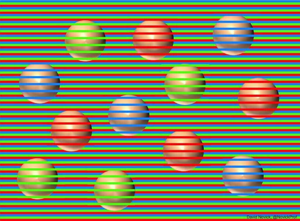
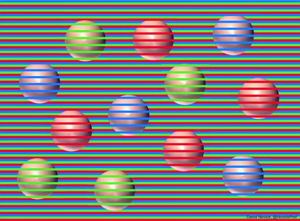
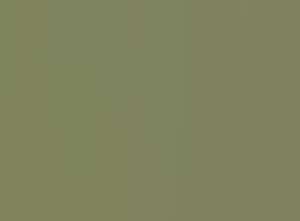


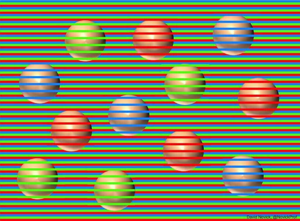
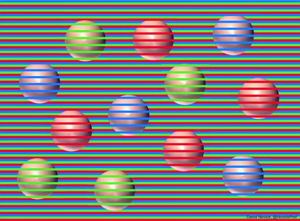
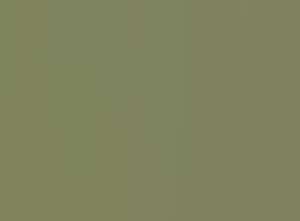

In [20]:
bars_img = load_img_RGB('./resources/exp_2_1/bars.jpg') 
imlist([bars_img, *high_pass(bars_img)])


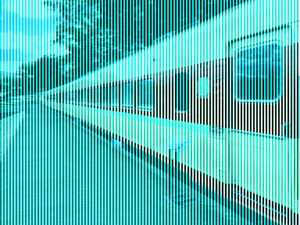
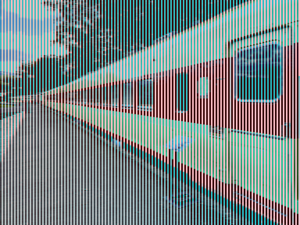
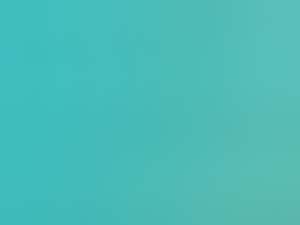


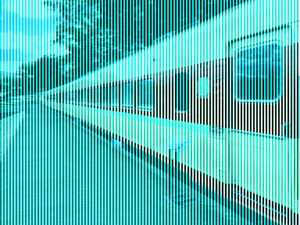
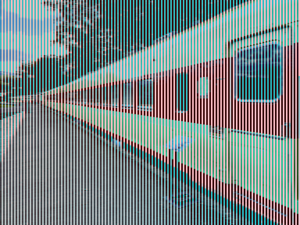
...
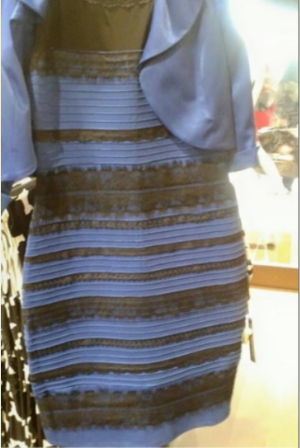
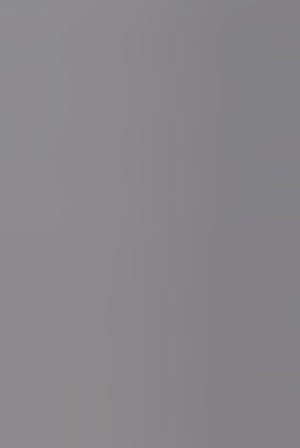


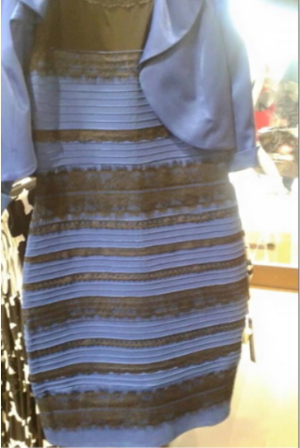
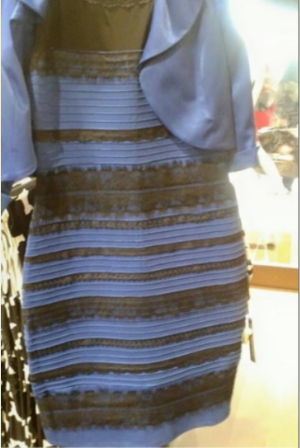
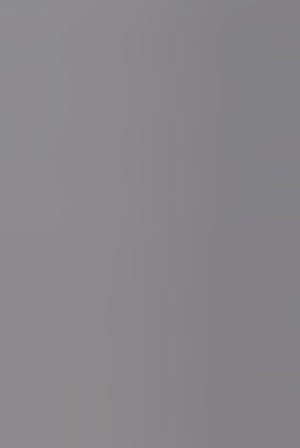

In [86]:
train = load_img_RGB('./resources/exp_2_1/redtrain.png')
imlist([train, *high_pass(train)])
dress = load_img_RGB('./resources/exp_2_1/brown_blue_dress.png')
imlist([dress, *high_pass(dress)])

In [59]:
def color_contrast_test():
    img = load_img_RGB('./resources/exp_2_1/sakai01.jpg') 
    blurred0 = cv2.GaussianBlur(img,  (999, 999), 400, 400)
    blurred1 = cv2.GaussianBlur(img,  (999, 999), 30, 30)
    #blurred = np.array(blurred, dtype=np.float32)
    t0 = 0.5
    t1 =  0.8
    hp = img*t0 + (1-t0)*(img - blurred0 + 127.0)
    hp = hp*t1 + (1-t1)*(hp + blurred1 + 127.0)
    hp = np.clip(hp, 0, 255.0)
    imlist([img, blurred0, blurred1, hp])
color_contrast_test()

ic| neg_total: -3.072
    num_a*a: -2.048
    num_b*b: -0.768
    num_c*c: -0.256



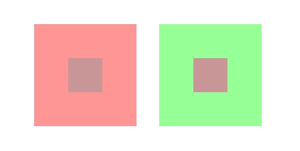
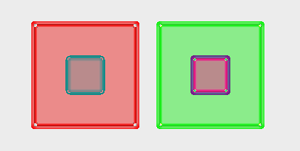


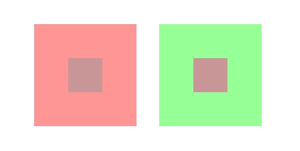
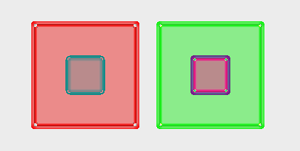

In [81]:
def color_contrast_test2():
    img = load_img_RGB('./resources/exp_2_1/sakai01.jpg') 
    num_a = 9 + 9 + 7 + 7
    num_b = 7 + 7 + 5 + 5
    num_c = 5 + 5 + 3 + 3
    a = -0.064
    b = -0.032 
    c = -0.016
    neg_total = num_a * a + num_b * b + num_c * c
    ic(neg_total, num_a*a, num_b*b, num_c*c)
    kernel1 = np.array([
        [a,   a,   a,   a,    a,   a,   a,   a,   a],
        [a,   b,   b,   b,    b,   b,   b,   b,   a],
        [a,   b,   c,   c,    c,   c,   c,   b,   a],
        [a,   b,   c,   0,    0,   0,   c,   b,   a],
        [a,   b,   c,   0,    4,   0,   c,   b,   a],
        [a,   b,   c,   0,    0,   0,   c,   b,   a],
        [a,   b,   c,   c,    c,   c,   c,   b,   a],
        [a,   b,   b,   b,    b,   b,   b,   b,   a],
        [a,   a,   a,   a,    a,   a,   a,   a,   a]])
    fimg = cv2.filter2D(img, ddepth=-1, kernel=kernel1)
    imlist([img, fimg])
    
color_contrast_test2()


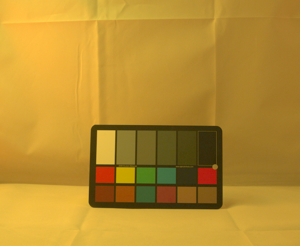
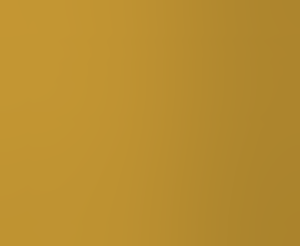
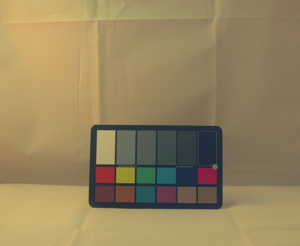
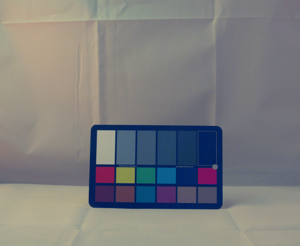


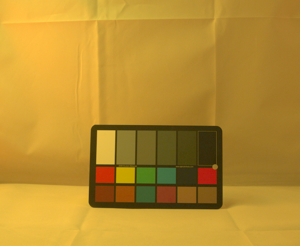
...
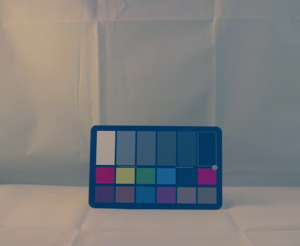


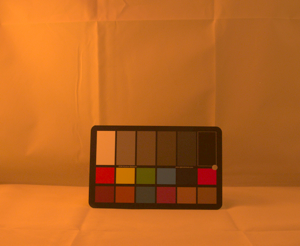
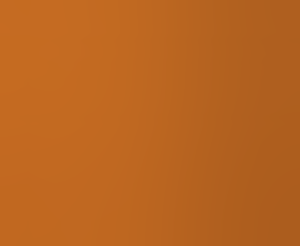
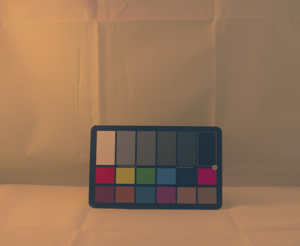
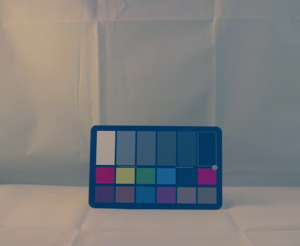

In [64]:
images = []
path = pathlib.Path('./resources/exp_2_1/macbeth/')
files = path.glob('*.jpg') 
for f in files:
    img = open_as_srgb(str(f))
    img = np.array(img, dtype=np.float32)
    images.append(img)
    hp, blurred = mixed_pass(img)
    imlist([img, blurred, hp, high_pass(img])